# Mock Challenge Level 2 Spectra --- `provabgs` mocks

In [1]:
import os
import pickle
import numpy as np 
# --- plotting --- 
import corner as DFM
import matplotlib as mpl
import matplotlib.pyplot as plt
#if 'NERSC_HOST' not in os.environ.keys():
#    mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False

In [2]:
import gqp_mc.util as UT

In [3]:
from provabgs import infer as Infer
from provabgs import models as Models

# read mock spectra

In [4]:
theta_obs = pickle.load(open('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/l2.theta.p', 'rb'))

wave_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_s2.wave.npy')
flux_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_s2.flux.npy')
ivar_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_s2.ivar.npy')

(0.0, 20)

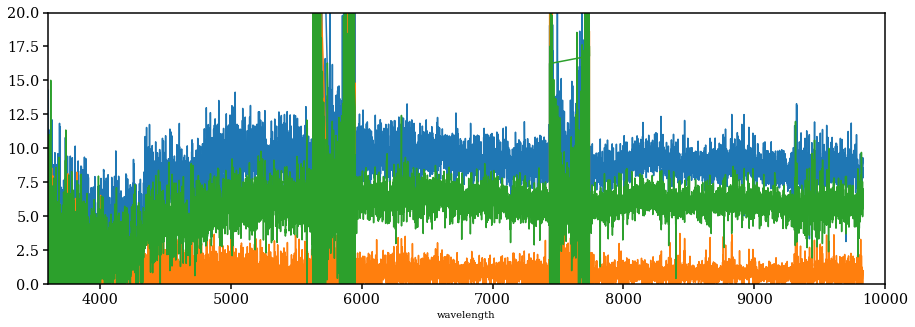

In [5]:
fig = plt.figure(figsize=(15,5))
sub = fig.add_subplot(111)
for f in flux_obs[:3]: 
    sub.plot(wave_obs, f)
sub.set_xlabel('wavelength')
sub.set_xlim(3.6e3, 1e4)
sub.set_ylim(0., 20)

# load in MCMC chains run on cori

In [6]:
prior = Infer.load_priors([
    Infer.UniformPrior(7.5, 12.5, label='sed'), 
    Infer.FlatDirichletPrior(4, label='sed'),   # flat dirichilet priors
    Infer.UniformPrior(0., 1., label='sed'), # burst fraction
    Infer.UniformPrior(1e-2, 13.27, label='sed'), # tburst
    Infer.LogUniformPrior(4.5e-5, 1.5e-2, label='sed'),# uniform priors on ZH coeffb
    Infer.LogUniformPrior(4.5e-5, 1.5e-2, label='sed'),# uniform priors on ZH coeff
    Infer.UniformPrior(0., 3., label='sed'),        # uniform priors on dust1 
    Infer.UniformPrior(0., 3., label='sed'),        # uniform priors on dust2
    Infer.UniformPrior(-2, 1, label='sed')     # uniform priors on dust_index 
])

m_nmf = Models.NMF(burst=True, emulator=True)

desi_mcmc = Infer.desiMCMC(model=m_nmf, prior=prior)

input parameters : logmstar, beta1_sfh, beta2_sfh, beta3_sfh, beta4_sfh, fburst, tburst, gamma1_zh, gamma2_zh, dust1, dust2, dust_index


In [7]:
chain_dir = os.path.join(UT.dat_dir(), 'mini_mocha', 'L2')
f_chain = lambda i: os.path.join(chain_dir, 'S2.provabgs_model.%i.chain.p' % i)

In [8]:
igals, chains = [], []
for i in range(100): 
    if os.path.isfile(f_chain(i)): 
        igals.append(i)
        chains.append(pickle.load(open(f_chain(i), 'rb')))

In [9]:
print(len(igals))

100


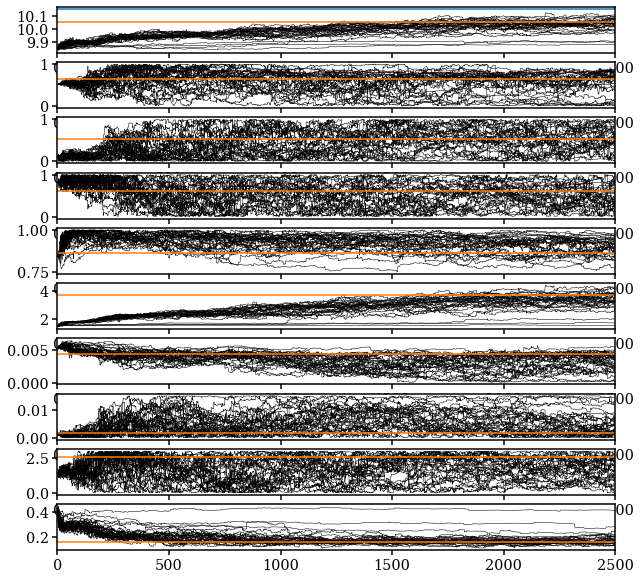

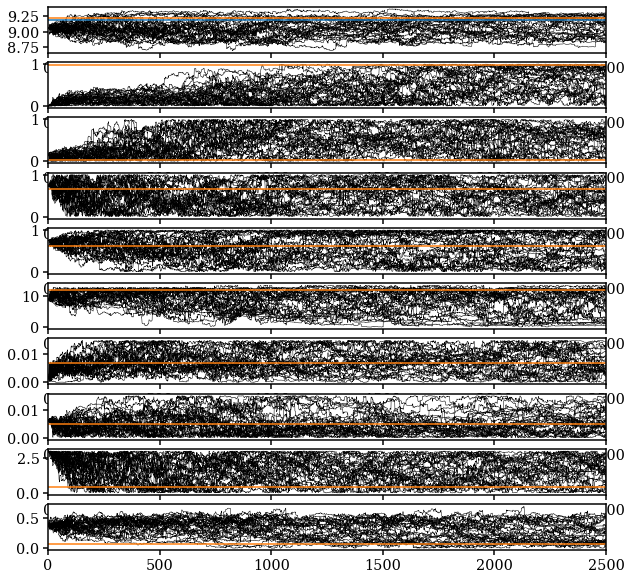

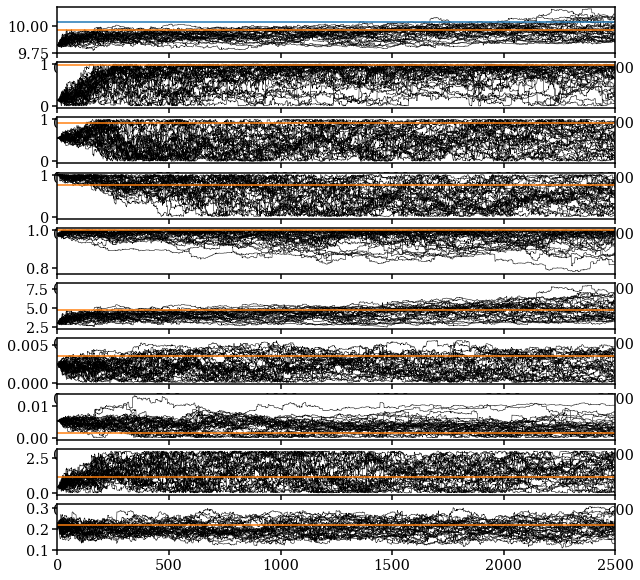

In [10]:
# examine the chains     
for i, chain in zip(igals[:3], chains): 
    unt_theta_bf = prior.untransform(chain['theta_bestfit'])
    fig = plt.figure(figsize=(10, 10))
    for ii in range(unt_theta_bf.shape[0]-1): 
        sub = fig.add_subplot(unt_theta_bf.shape[0]-1, 1, ii+1)
        for j in range(30): 
            unt_chain_i = desi_mcmc.prior.untransform(chain['mcmc_chain'][:,j,:])
            sub.plot(unt_chain_i[:,ii], c='k', lw=0.5)
        if ii == 0: sub.axhline(theta_obs['logM_fiber'][i], color='C0')
        sub.axhline(unt_theta_bf[ii], color='C1')
        sub.set_xlim(0,2500)

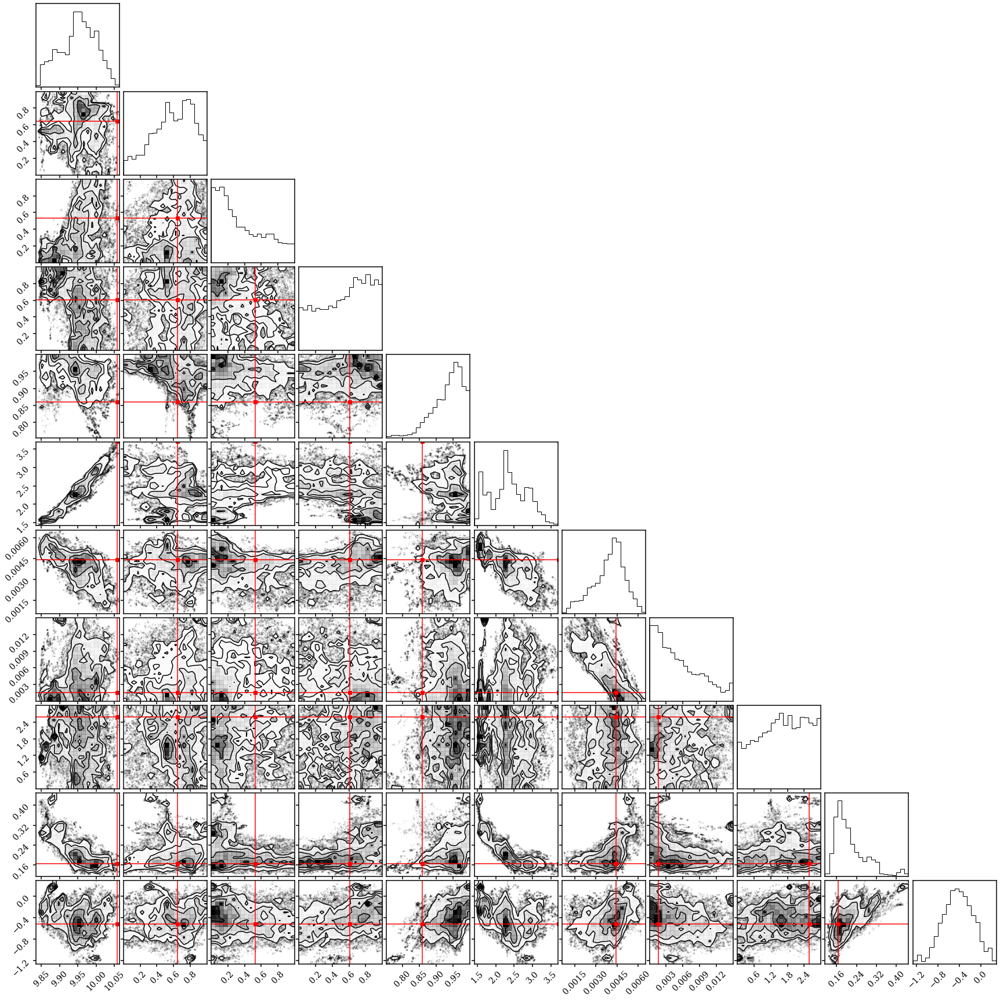

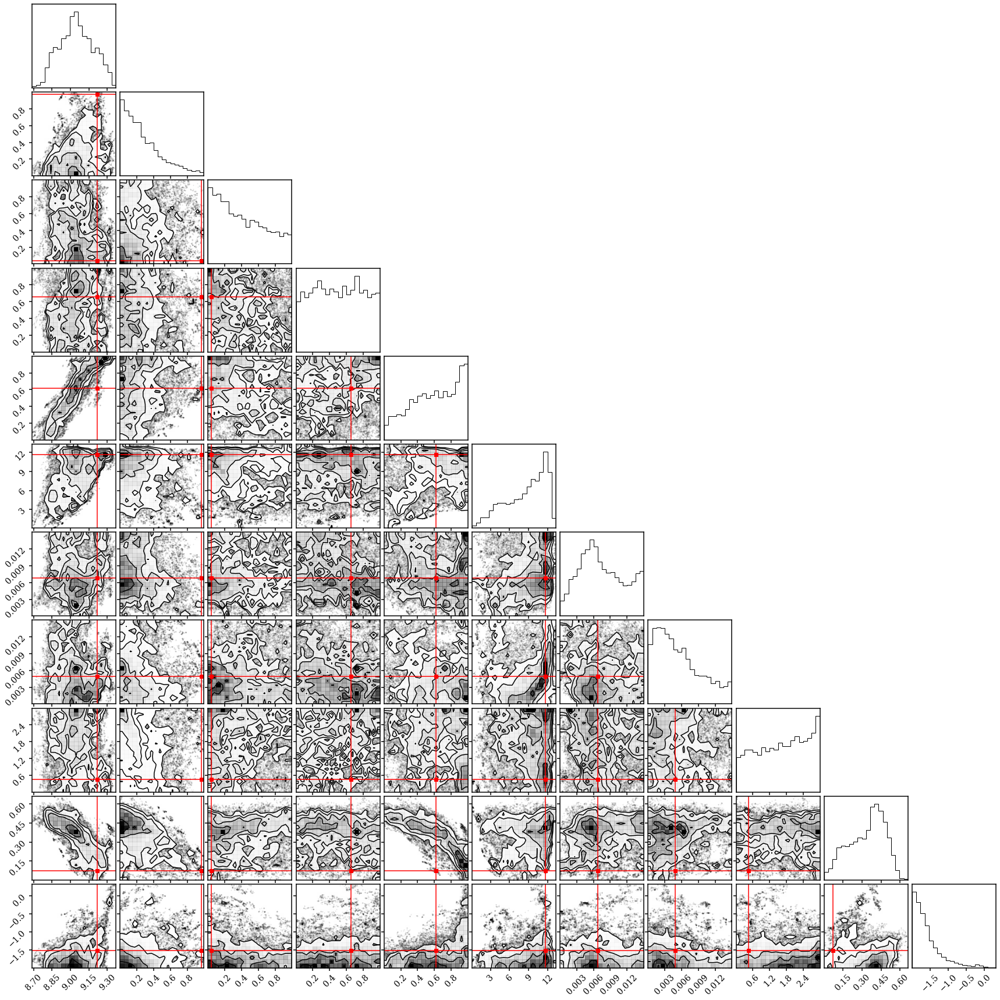

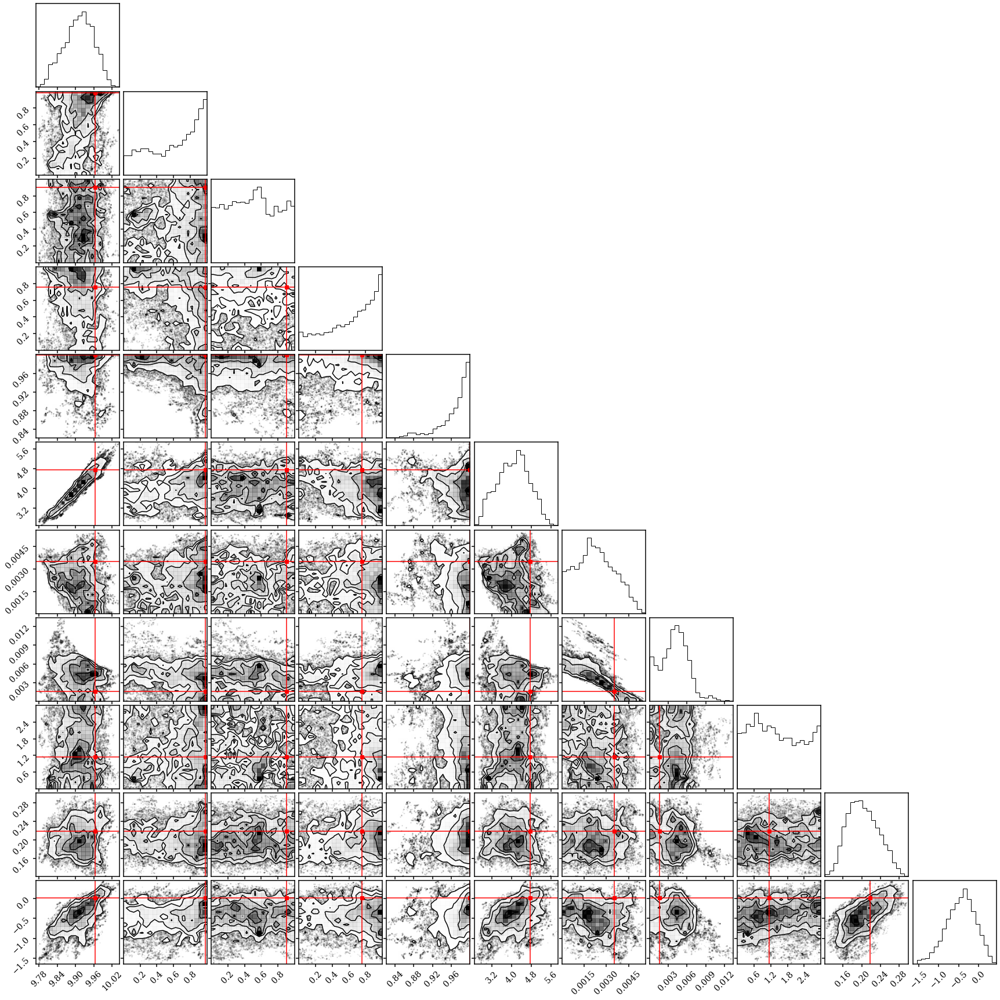

In [11]:
# examine the chains     
for i, chain in zip(igals[:3], chains): 
    unt_theta_bf = prior.untransform(chain['theta_bestfit'])
    unt_chain = prior.untransform(desi_mcmc._flatten_chain(chain['mcmc_chain'][:1500,:,:]))
    
    fig = DFM.corner(unt_chain)
    
    axes = np.array(fig.axes).reshape((unt_theta_bf.shape[0], unt_theta_bf.shape[0]))

    # Loop over the histograms
    for yi in range(unt_theta_bf.shape[0]):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axvline(unt_theta_bf[xi], color="r")
            ax.axhline(unt_theta_bf[yi], color="r")
            ax.plot(unt_theta_bf[xi], unt_theta_bf[yi], "sr")

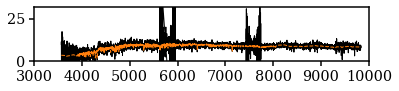

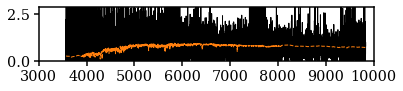

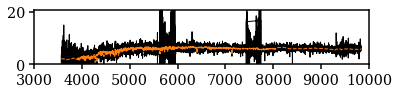

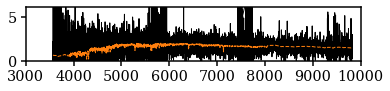

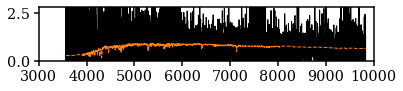

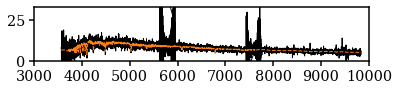

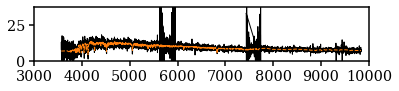

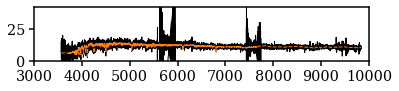

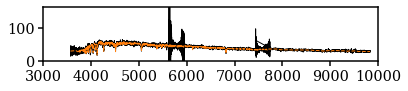

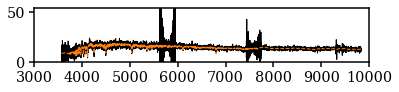

In [12]:
# examine the chains     
for i, chain in zip(igals[:10], chains): 
    fig = plt.figure(figsize=(6,1))
    sub = fig.add_subplot(111)
    sub.plot(wave_obs, flux_obs[i], c='k', lw=1)
    sub.plot(chain['wavelength_obs'], chain['flux_spec_model'], c='C1', ls='--', lw=1)
    sub.set_xlim(3e3, 1e4)    
    sub.set_ylim(0, 3*np.max(chain['flux_spec_model'][wave_obs > 5000]))

In [13]:
flat_chains = []
logMstar_true, logMstar_inf = [], [] 
logSSFR_true, logSSFR_inf = [], [] 
logZ_MW_true, logZ_MW_inf = [], []

for i, chain in zip(igals, chains): 
    flat_chain = desi_mcmc._flatten_chain(chain['mcmc_chain'][1500:,:,:])       
    flat_chains.append(flat_chain)
    
    z_obs = theta_obs['redshift'][i]
    
    logMstar_true.append(theta_obs['logM_fiber'][i])
    logMstar_inf.append(flat_chain[:,0])
    
    logSSFR_true.append(np.log10(theta_obs['sfr_1gyr'][i]) - theta_obs['logM_total'][i])
    logSSFR_inf.append(np.log10(m_nmf.avgSFR(flat_chain, zred=z_obs, dt=1.0)) - flat_chain[:,0])
    
    logZ_MW_true.append(np.log10(theta_obs['Z_MW'])[i])
    logZ_MW_inf.append(np.log10(m_nmf.Z_MW(flat_chain, zred=z_obs)))
    
flat_chains = np.array(flat_chains)

logMstar_true = np.array(logMstar_true)
logMstar_inf = np.array(logMstar_inf)

logSSFR_true = np.array(logSSFR_true).flatten()
logSSFR_inf = np.array(logSSFR_inf)

logZ_MW_true = np.array(logZ_MW_true).flatten()
logZ_MW_inf = np.array(logZ_MW_inf)

In [47]:
theta_obs.keys()

dict_keys(['t_lookback', 'dt', 'sfh_disk', 'sfh_bulge', 'Z_disk', 'Z_bulge', 'logM_disk', 'logM_bulge', 'logM_total', 't_age_MW', 'Z_MW', 'redshift', 'cosi', 'tau_ism', 'tau_bc', 'vd_disk', 'vd_bulge', 'logM_fiber', 'sfr_1gyr', 'sfr_100myr', 'f_fiber_meas', 'f_fiber_sigma'])

In [49]:
flat_chains[0].shape

(30000, 12)

In [70]:
tauism_true, tauism_inf = [], [] 
for i, chain in zip(igals, flat_chains): 
    tauism_true.append(theta_obs['tau_ism'][i])
    tauism_inf.append(chain[:,-2])
tauism_true = np.array(tauism_true)
tauism_inf = np.array(tauism_inf)

In [62]:
# lets calculate the median, +/- sigma for each of the derived properties
logm_q = np.array([DFM.quantile(logMstar_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
logssfr_q = np.array([DFM.quantile(logSSFR_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
logzmw_q = np.array([DFM.quantile(logZ_MW_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
tauism_q = np.array([DFM.quantile(tauism_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])

(0.0, 3)

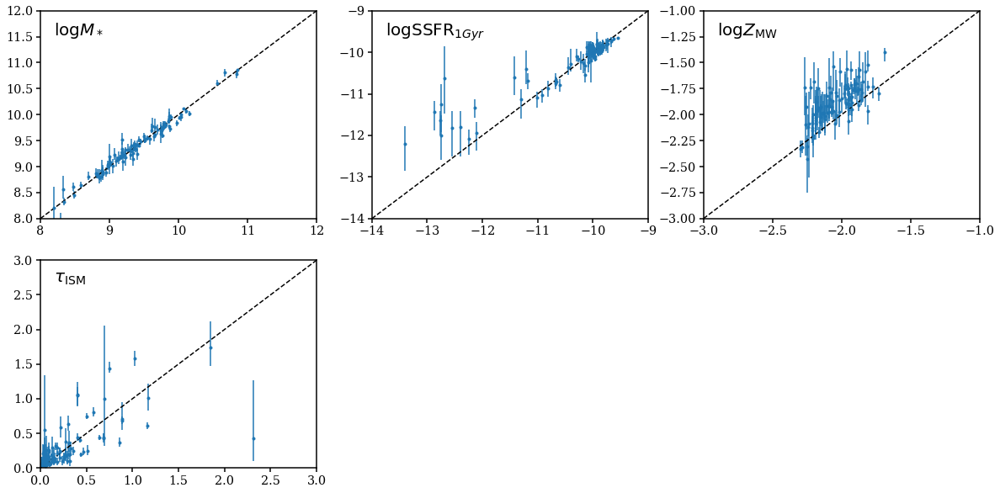

In [66]:
fig = plt.figure(figsize=(20,10))
sub = fig.add_subplot(231)
sub.errorbar(logMstar_true, logm_q[:,1], 
             yerr=[logm_q[:,1]-logm_q[:,0], logm_q[:,2]-logm_q[:,1]],
             fmt='.C0')
sub.plot([8., 12.], [8., 12], c='k', ls='--')
sub.text(0.05, 0.95, r'$\log M_*$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.set_xlim(8., 12.)
sub.set_ylim(8., 12.)

sub = fig.add_subplot(232)
sub.errorbar(logSSFR_true, logssfr_q[:,1], 
             yerr=[logssfr_q[:,1]-logssfr_q[:,0], logssfr_q[:,2]-logssfr_q[:,1]], 
             fmt='.C0')
sub.plot([-9., -15.], [-9., -15], c='k', ls='--')
sub.text(0.05, 0.95, r'$\log {\rm SSFR}_{1Gyr}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.set_xlim(-14, -9.)
sub.set_ylim(-14, -9.)

sub = fig.add_subplot(233)
sub.errorbar(logZ_MW_true, logzmw_q[:,1], 
             yerr=[logzmw_q[:,1] - logzmw_q[:,0], logzmw_q[:,2] - logzmw_q[:,1]], 
             fmt='.C0')
sub.text(0.05, 0.95, r'$\log Z_{\rm MW}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.plot([-3., -1], [-3, -1], c='k', ls='--')
sub.set_xlim(-3., -1)
sub.set_ylim(-3., -1)

sub = fig.add_subplot(234)
sub.errorbar(tauism_true, tauism_q[:,1], 
             yerr=[tauism_q[:,1] - tauism_q[:,0], tauism_q[:,2] - tauism_q[:,1]], 
             fmt='.C0')
sub.text(0.05, 0.95, r'$\tau_{\rm ISM}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.plot([0., 3.], [0., 3.], c='k', ls='--')
sub.set_xlim(0., 3)
sub.set_ylim(0., 3)

In [71]:
dlogMstar = logMstar_inf - logMstar_true[:,None]
dlogSSFR = logSSFR_inf - logSSFR_true[:,None]
dlogZ_MW = logZ_MW_inf - logZ_MW_true[:,None]
dtau_ism = tauism_inf - tauism_true[:,None]

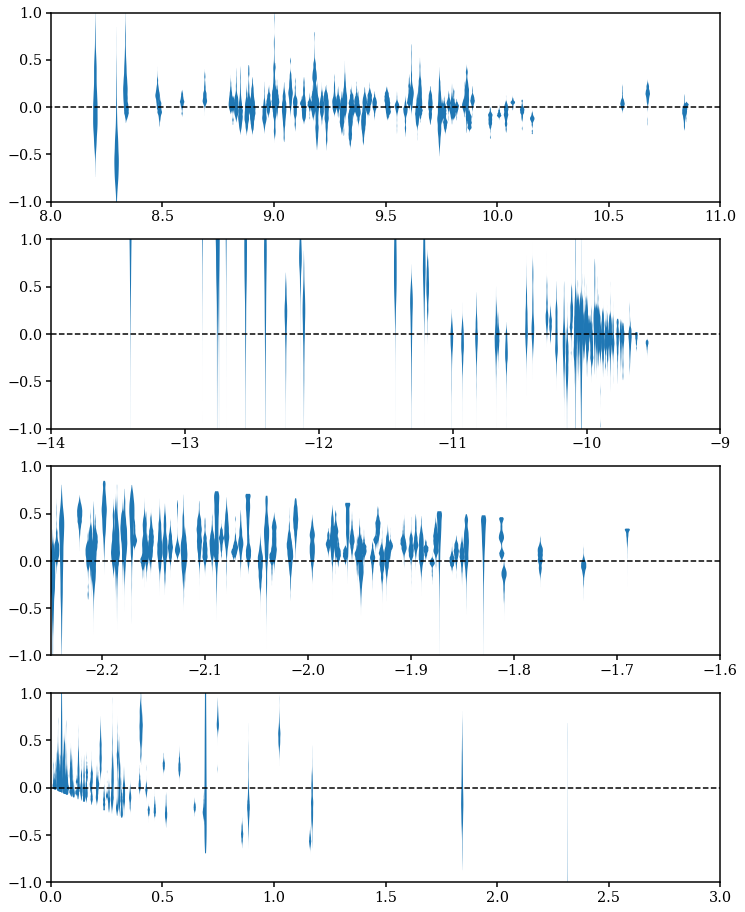

In [75]:
fig = plt.figure(figsize=(12,16))
for i, dprop, prop in zip(range(4), [dlogMstar, dlogSSFR, dlogZ_MW, dtau_ism], [logMstar_true, logSSFR_true, logZ_MW_true, tauism_true]):
    sub = fig.add_subplot(4,1,i+1)
    violins = sub.violinplot(dprop.T, positions=prop, 
                             widths=[0.02, 0.02, 0.005, 0.01][i], showextrema=False)
    for violin in violins['bodies']:
        violin.set_facecolor('C0')
        violin.set_alpha(1.)
    sub.plot([[7., 12.], [-14., -9.], [-3, -1], [0., 3]][i], [0, 0], c='k', ls='--')
    sub.set_xlim([[8., 11.], [-14., -9.], [-2.25, -1.6], [0., 3.]][i])
    sub.set_ylim(-1., 1.)

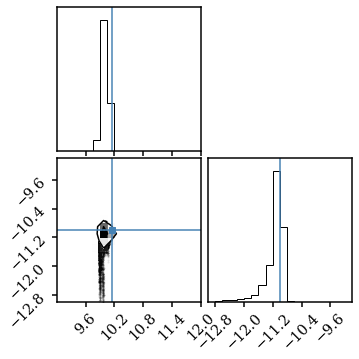

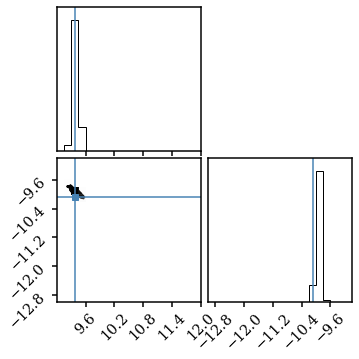

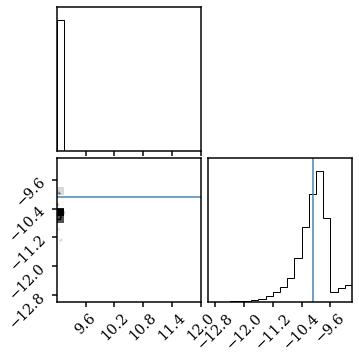

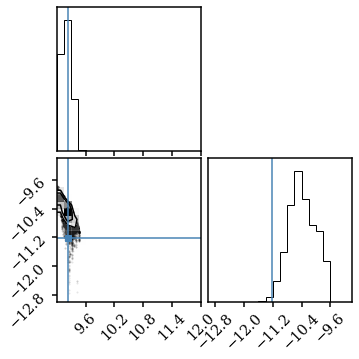

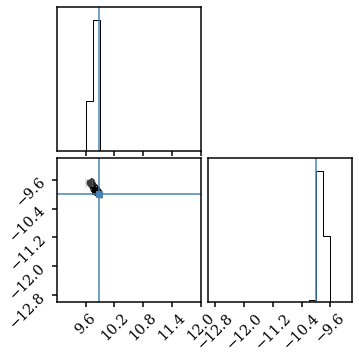

In [16]:
for i in range(50)[::10]: 
    theta_deriv = np.array([logMstar_inf[i], logSSFR_inf[i]])#, logZ_MW_inf[i]])
    theta_true = np.array([logMstar_true[i], logSSFR_true[i]])#, logZ_MW_true[i]])
    DFM.corner(theta_deriv.T, 
               truths=theta_true, 
              range=[(9, 12), (-13, -9.)])#, (-3., -1)])

In [24]:
bad_ssfr = (np.abs(logSSFR_true - logssfr_q[:,1]) > 1.) #| (np.abs(logZ_MW_true - logzmw_q[:,1]) > 0.5)

In [29]:
logSSFR_true[bad_ssfr], logssfr_q[bad_ssfr, 1]

(array([-12.69069263, -12.86645626, -14.98442038,         -inf,
        -14.48623357, -16.62490909, -16.1826008 , -13.40491077,
                -inf, -12.7441286 , -16.74170556,         -inf,
        -12.76191028]),
 array([-10.6216569 , -11.43307173, -12.04000155, -12.19731835,
        -12.04345062, -11.19149596, -12.13665676, -12.21222057,
        -11.80839806, -11.24710322, -10.62014725, -11.42234642,
        -11.63439917]))

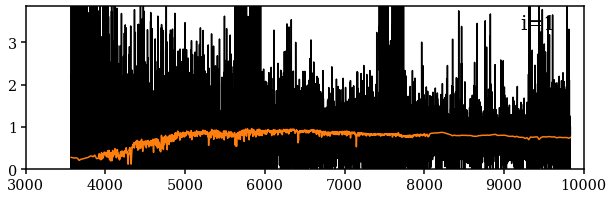

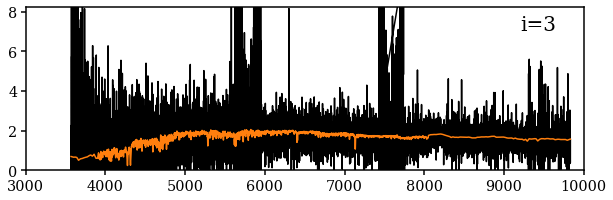

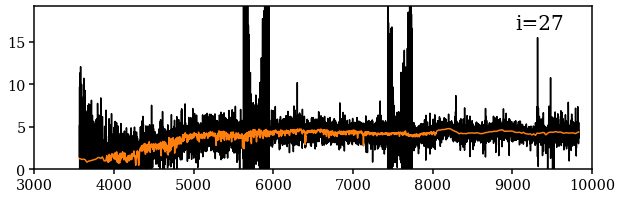

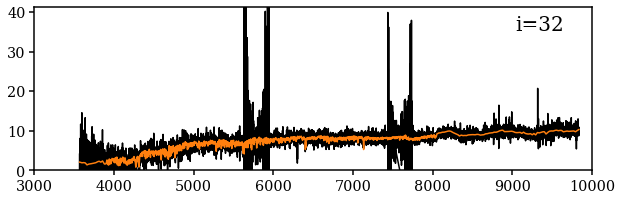

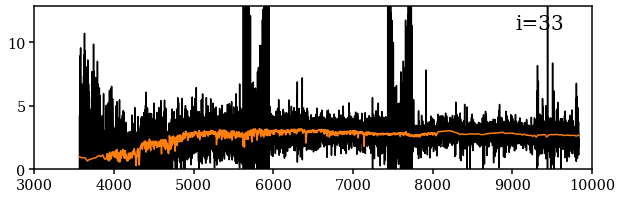

...

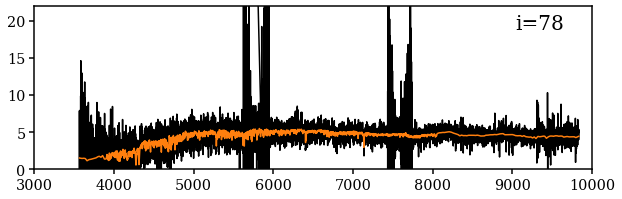

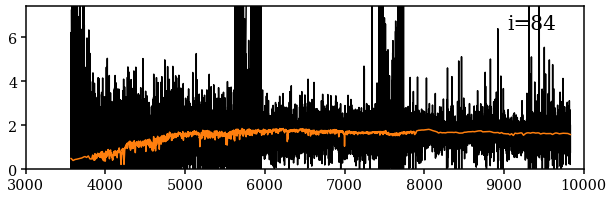

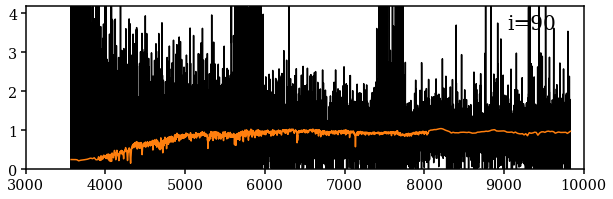

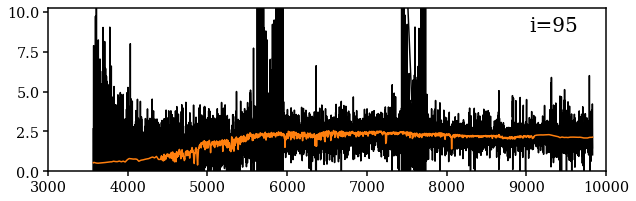

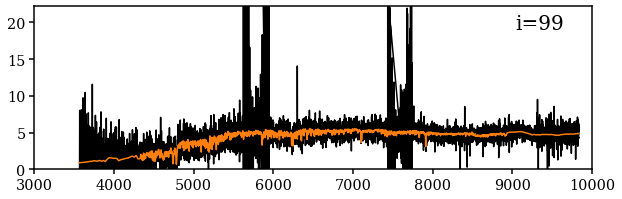

In [31]:
for i in np.arange(len(bad_ssfr))[bad_ssfr]: 
    fig = plt.figure(figsize=(10,3))
    sub = fig.add_subplot(111)
    sub.plot(wave_obs, flux_obs[igals[i]], c='k')
    sub.plot(chains[i]['wavelength_obs'], chains[i]['flux_spec_model'], c='C1', label='bestfit')
    sub.set_xlim(3e3, 1e4)    
    sub.set_ylim(0, 4*np.max(chains[i]['flux_spec_model'][wave_obs > 5000]))
    if ii == 0: 
        sub.legend(loc='upper left', fontsize=15, frameon=True)
    sub.text(0.95, 0.95, 'i=%i' % i, ha='right', va='top', transform=sub.transAxes, fontsize=20)

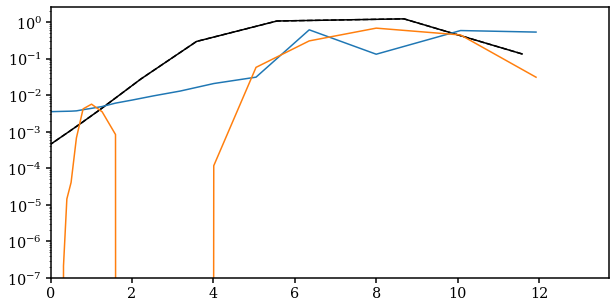

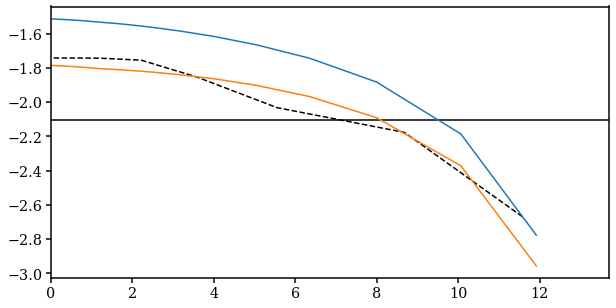

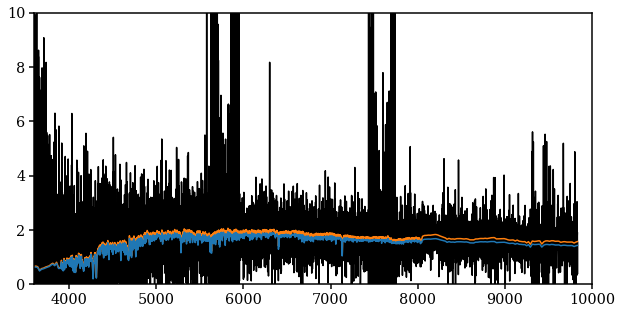

In [69]:
for i in [3]: 
    '''
    unt_theta_bf = prior.untransform(chains[i]['theta_bestfit'])
    
    fig = plt.figure(figsize=(10, 10))
    for ii in range(unt_theta_bf.shape[0]-1): 
        sub = fig.add_subplot(unt_theta_bf.shape[0]-1, 1, ii+1)
        for j in range(30): 
            unt_chain_i = desi_mcmc.prior.untransform(chains[i]['mcmc_chain'][:,j,:])
            sub.plot(unt_chain_i[:,ii], c='k', lw=0.5)
        if ii == 0: sub.axhline(theta_obs['logM_fiber'][igals[i]], color='C0')
        sub.axhline(unt_theta_bf[ii], color='C1')
        sub.set_xlim(0,2500)

    unt_chain = prior.untransform(desi_mcmc._flatten_chain(chains[i]['mcmc_chain'][:1500,:,:]))
    
    fig = DFM.corner(unt_chain, truths=unt_bf)
    theta_deriv = np.array([logMstar_inf[i], logSSFR_inf[i], logZ_MW_inf[i]])
    theta_true = np.array([logMstar_true[i], logSSFR_true[i], logZ_MW_true[i]])
    DFM.corner(theta_deriv.T, 
               truths=theta_true, 
              range=[(9, 12), (-13, -9.), (-3., -1)])
    '''
    theta_i = np.zeros(len(chains[i]['theta_bestfit']))
    theta_i[0] = theta_obs['logM_fiber'][igals[i]]
    theta_i[1] = 0.
    theta_i[2] = 0.
    theta_i[3] = 1.
    theta_i[4] = 0.
    theta_i[5] = 0
    theta_i[7] = 3e-3
    theta_i[8] = 2e-3#7.84027029e-05#1e-2# 2.89134312e-03

    fig = plt.figure(figsize=(10,5))
    sub = fig.add_subplot(111)
    sub.plot(theta_obs['t_lookback'][igals[i]], (theta_obs['sfh_disk'][igals[i]] + theta_obs['sfh_bulge'][igals[i]]) / theta_obs['dt'][igals[i]] / 1e9, c='k')
    sub.plot(theta_obs['t_lookback'][igals[i]], theta_obs['sfh_disk'][igals[i]] / theta_obs['dt'][igals[i]] / 1e9, ls='--', c='k')    
    sub.plot(theta_obs['t_lookback'][igals[i]], theta_obs['sfh_bulge'][igals[i]] / theta_obs['dt'][igals[i]] / 1e9, ls=':', c='k')  
    
    t, sfh = m_nmf.SFH(chains[i]['theta_bestfit'], zred=theta_obs['redshift'][igals[i]])
    sub.plot(0.5*(t[1:] + t[:-1]), sfh)
    
    t, sfh = m_nmf.SFH(theta_i, zred=theta_obs['redshift'][igals[i]])
    sub.plot(0.5*(t[1:] + t[:-1]), sfh)

    sub.set_xlim(0., 13.7)
    sub.set_yscale('log')
    
    
    fig = plt.figure(figsize=(10,5))
    sub = fig.add_subplot(111)
    sub.plot(theta_obs['t_lookback'][igals[i]], np.log10(theta_obs['Z_disk'][igals[i]]), c='k', ls='--')
    sub.plot(theta_obs['t_lookback'][igals[i]], np.log10(theta_obs['Z_bulge'][igals[i]]), c='k', ls=':')
    
    sub.axhline(logZ_MW_true[i], color='k', linestyle='-')
    t, zh = m_nmf.ZH(chains[i]['theta_bestfit'], zred=theta_obs['redshift'][igals[i]])
    
    #theta_obs['sfh_disk'][igals[i]] / theta_obs['dt'][igals[i]] / 1e9, ls='--', c='k')    
    sub.plot(0.5*(t[1:] + t[:-1]), np.log10(zh))
    
    t, zh = m_nmf.ZH(theta_i, zred=theta_obs['redshift'][igals[i]])
    sub.plot(0.5*(t[1:] + t[:-1]), np.log10(zh))
    sub.set_xlim(0., 13.7)
    #sub.set_yscale('log')

    fig = plt.figure(figsize=(10,5))
    sub = fig.add_subplot(111)
    w, f= m_nmf.sed(theta_i, zred=theta_obs['redshift'][igals[i]], wavelength=chains[i]['wavelength_obs'])
    sub.plot(chains[i]['wavelength_obs'], chains[i]['flux_spec_obs'], c='k', label='bestfit')
    sub.plot(chains[i]['wavelength_obs'], chains[i]['flux_spec_model'], c='C1', label='bestfit')
    sub.plot(w, f)
    sub.set_xlim(3.6e3, 1e4)
    sub.set_ylim(0., 10)

For all of the spectra we're able to reproduce $M_*$. However, for some of the spectra, we seem to be just recovering the prior for $\log{\rm SSFR}$ and $\log Z_{\rm MW}$. Lets check: 
- the bestfit spectra are good fits to the data
- Is this due to inherent degeneracies in the model? 

In [30]:
bad_ssfr = (logMstar_true > 9.) & (np.abs(logSSFR_true - logssfr_q[:,1]) > 1.) #| (np.abs(logZ_MW_true - logzmw_q[:,1]) > 0.5)

(-3.0, -1)

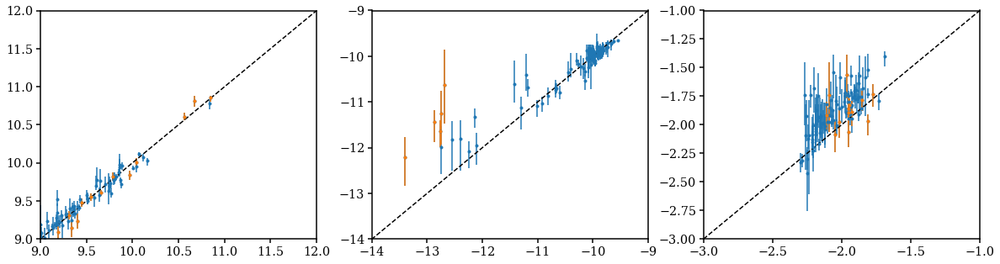

In [27]:
fig = plt.figure(figsize=(20, 5))
sub = fig.add_subplot(131)
sub.errorbar(logMstar_true, logm_q[:,1], 
             yerr=[logm_q[:,1]-logm_q[:,0], logm_q[:,2]-logm_q[:,1]],
             fmt='.C0')
sub.errorbar(logMstar_true[bad_ssfr], logm_q[bad_ssfr,1], 
             yerr=[logm_q[bad_ssfr,1]-logm_q[bad_ssfr,0], logm_q[bad_ssfr,2]-logm_q[bad_ssfr,1]],
             fmt='.C1')
sub.plot([9., 12.], [9., 12], c='k', ls='--')
sub.set_xlim(9., 12.)
sub.set_ylim(9., 12.)

sub = fig.add_subplot(132)
sub.errorbar(logSSFR_true, logssfr_q[:,1], 
             yerr=[logssfr_q[:,1]-logssfr_q[:,0], logssfr_q[:,2]-logssfr_q[:,1]], 
             fmt='.C0')
sub.errorbar(logSSFR_true[bad_ssfr], logssfr_q[bad_ssfr,1], 
             yerr=[logssfr_q[bad_ssfr,1]-logssfr_q[bad_ssfr,0], logssfr_q[bad_ssfr,2]-logssfr_q[bad_ssfr,1]], 
             fmt='.C1')
sub.plot([-9., -15.], [-9., -15], c='k', ls='--')
sub.set_xlim(-14, -9.)
sub.set_ylim(-14, -9.)

sub = fig.add_subplot(133)
sub.errorbar(logZ_MW_true, logzmw_q[:,1], 
             yerr=[logzmw_q[:,1] - logzmw_q[:,0], logzmw_q[:,2] - logzmw_q[:,1]], 
             fmt='.C0')
sub.errorbar(logZ_MW_true[bad_ssfr], logzmw_q[bad_ssfr,1], 
             yerr=[logzmw_q[bad_ssfr,1] - logzmw_q[bad_ssfr,0], logzmw_q[bad_ssfr,2] - logzmw_q[bad_ssfr,1]], 
             fmt='.C1')
sub.plot([-3., -1], [-3, -1], c='k', ls='--')
sub.set_xlim(-3., -1)
sub.set_ylim(-3., -1)